In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [8]:
# waterDF = pd.read_excel('수도전기사용량_3개월분_수정본.xlsx', sheet_name='수도사용량_3개월분', header=1)
# electDF = pd.read_excel('수도전기사용량_3개월분_수정본.xlsx', sheet_name='전기사용량_3개월분', header=1)

waterDF = pd.read_excel('따끈따끈 테스트 데이터_수도사용량_3개월분_data.xlsx', sheet_name = '따끈따끈 테스트 데이터_수도사용량_3개월분_data', header=1)
electDF = pd.read_excel('따끈따끈 테스트 데이터_전기사용량_3개월분_data.xlsx', sheet_name = '따끈따끈 테스트 데이터_전기사용량_3개월분_data', header=1)

In [ ]:
electDF.dropna(axis=1, inplace=True)
electDF.drop(['Unnamed: 0'], axis=1, inplace=True)
electDF.head()
len(electDF.columns)

In [4]:
waterDF.dropna(axis=1, inplace=True)
waterDF.drop(['Unnamed: 0'], axis=1, inplace=True)
waterDF.head()

,2023-06-01 00:00:00,2023-06-01 00:00:00.1,2023-06-01 00:00:00.2,2023-06-01 00:00:00.3,2023-06-02 00:00:00,2023-06-02 00:00:00.1,2023-06-02 00:00:00.2,2023-06-02 00:00:00.3,2023-06-03 00:00:00,2023-06-03 00:00:00.1,...,2023-08-29 00:00:00.2,2023-08-29 00:00:00.3,2023-08-30 00:00:00,2023-08-30 00:00:00.1,2023-08-30 00:00:00.2,2023-08-30 00:00:00.3,2023-08-31 00:00:00,2023-08-31 00:00:00.1,2023-08-31 00:00:00.2,2023-08-31 00:00:00.3
0,1,2,3,4,1,2,3,4,1,2,...,3,4,1,2,3,4,1,2,3,4
1,30,120,210,410,32,184,180,260,35,145,...,190,230,98,143,253,198,78,159,169,147
2,58,218,290,105,10,68,38,263,78,150,...,214,247,53,160,210,150,39,120,147,110
3,28,184,150,38,62,151,140,145,78,315,...,210,150,69,169,251,169,47,157,230,169
4,14,169,89,55,55,130,135,138,28,184,...,180,260,14,145,203,216,55,136,189,84


In [11]:
water1 = waterDF.iloc[1,:]
water1

1           3
179       238
247       227
213       253
247.1     172
         ... 
236.6     221
230.6     222
215.6     216
231.11    235
222.12    228
Name: 1, Length: 365, dtype: int64

In [12]:
elect1 = electDF.iloc[1,:]
elect1

1.000000    3.000000
1.669952    1.605047
1.614250    1.700944
1.734924    1.739414
1.738061    1.616336
              ...   
1.692834    1.629110
1.669799    1.648664
1.640836    1.717918
1.657629    1.727260
1.660758    1.675730
Name: 1, Length: 365, dtype: float64

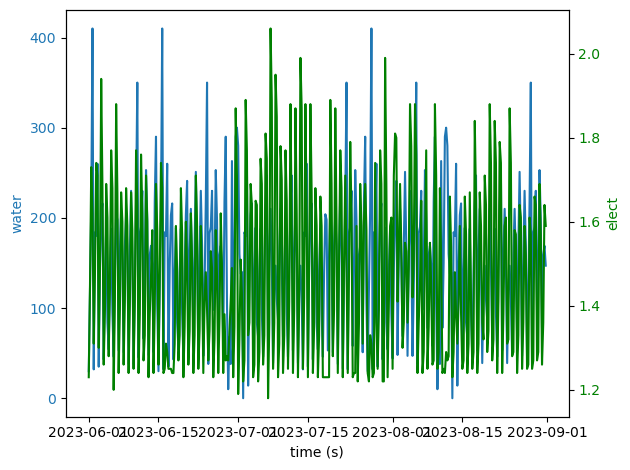

In [10]:
# Create some mock data

fig, ax1 = plt.subplots()
t = pd.date_range('2023-06-01', '2023-09-01', freq = '6H')
t = t[:-1]
color = 'tab:blue'
ax1.set_xlabel('time (s)')
ax1.set_ylabel('water', color=color)
ax1.plot(t, water1, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second Axes that shares the same x-axis

color = 'green'
ax2.set_ylabel('elect', color=color)  # we already handled the x-label with ax1
ax2.plot(t, elect1, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

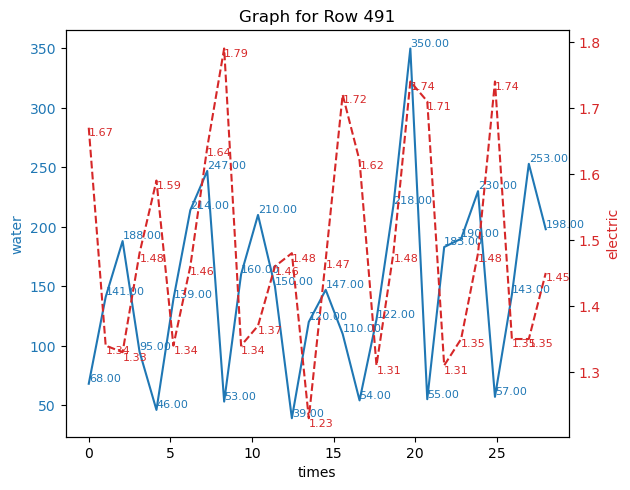

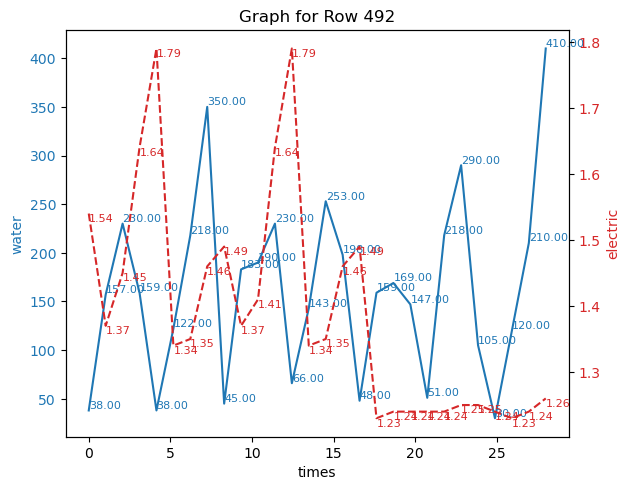

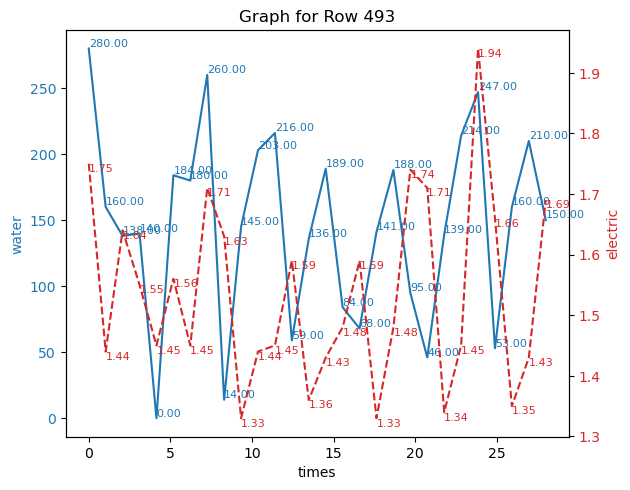

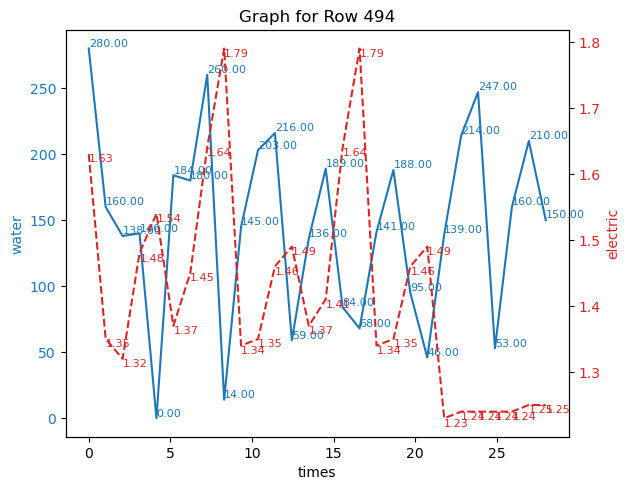

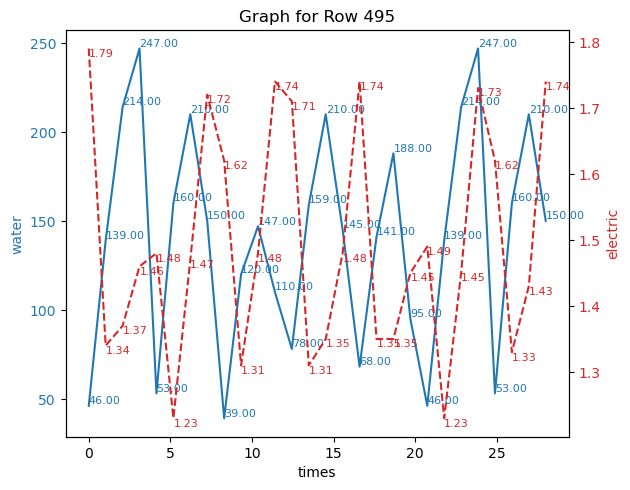

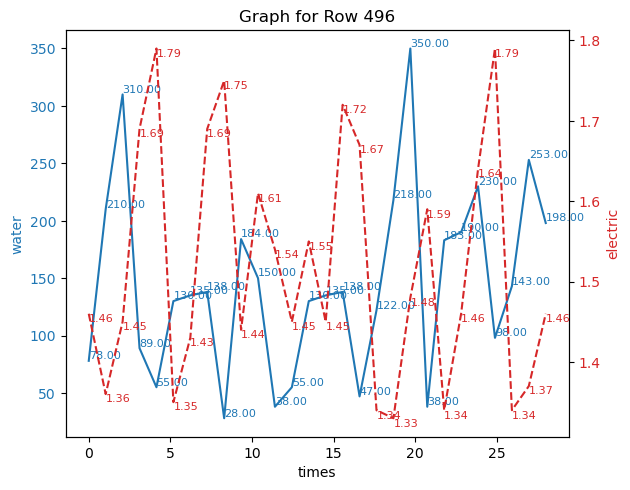

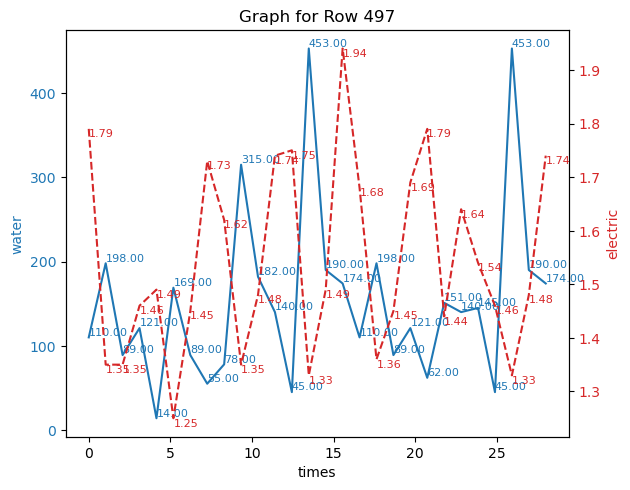

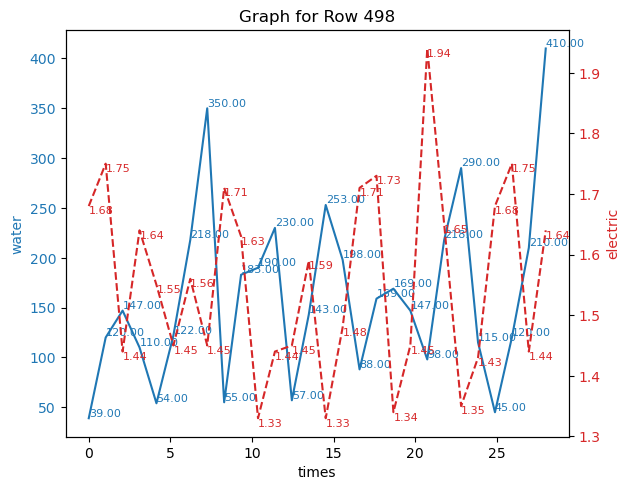

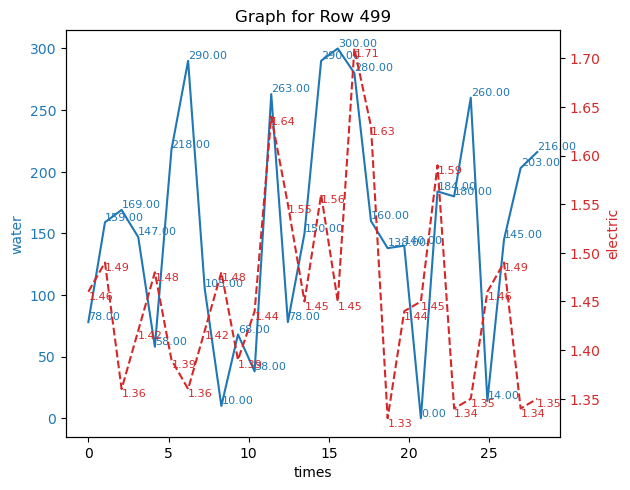

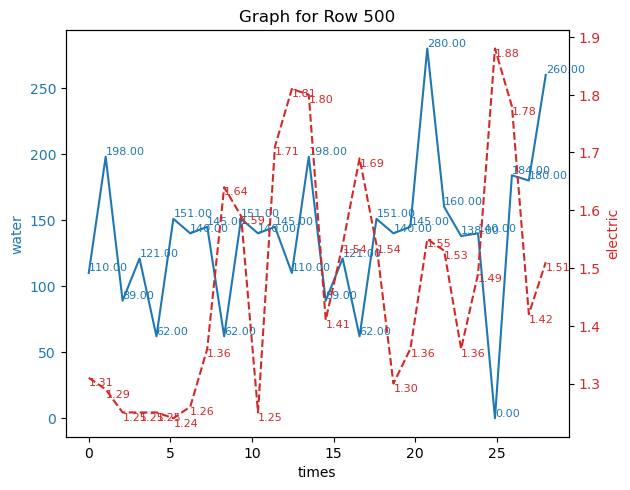

In [ ]:
# num_graphs = min(len(waterDF), len(electDF))  # 가능한 최대 그래프 수 제한

# 시작지점, 끝지점 설정
start = 491
end = 500
days = 7 * 4 # 하루 4번씩 측정

# 각 행에 대해 그래프 생성
for i in range(start, end+1):
    # i번째 행의 데이터 가져오기
    y = waterDF.iloc[i][:days].values
    z = electDF.iloc[i][:days].values
    
    # 시간 배열 생성
    t = np.linspace(0, days, days)
    
    # 그래프 생성
    fig, ax1 = plt.subplots()
    
    # 첫 번째 y축 - 물 데이터
    color = 'tab:blue'
    ax1.set_xlabel('times')
    ax1.set_ylabel('water', color=color)
    ax1.plot(t, y, color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    
    # 물 데이터 위에 수치 표시
    for j, value in enumerate(y):
        ax1.text(t[j], y[j], f'{value:.2f}', va='bottom', color=color, fontsize=8)
        # va='bottom'는 수직 방향 설정(vertical alignment) // top, center, bottom

    # 두 번째 y축 - 전기 데이터
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('electric', color=color)
    ax2.plot(t, z, color=color, linestyle='--')
    ax2.tick_params(axis='y', labelcolor=color)
    
    # 전기 데이터 위에 수치 표시
    for j, value in enumerate(z):
        ax2.text(t[j], z[j], f'{value:.2f}', va='top', color=color, fontsize=8)

    # 레이아웃 조정 및 그래프 표시
    fig.tight_layout()
    plt.title(f'Graph for Row {i}')  # 각 그래프에 제목 추가
    plt.show()

- 가구당 6월 1일부터 8월 31일까지 한번에 보는 그래프

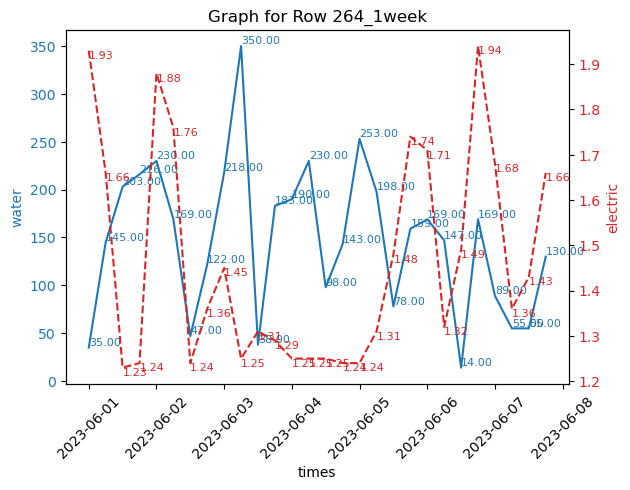

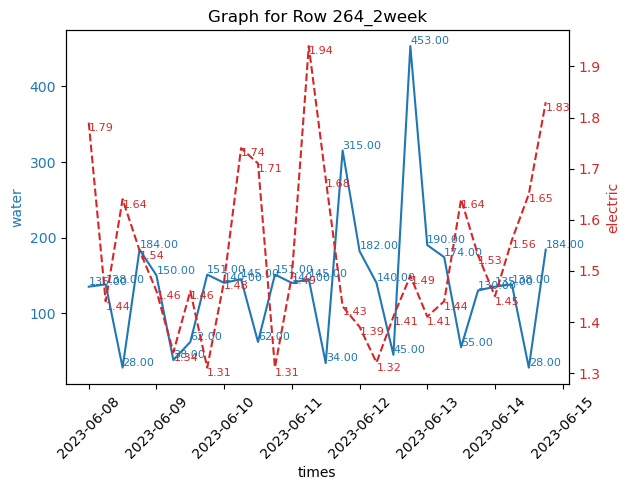

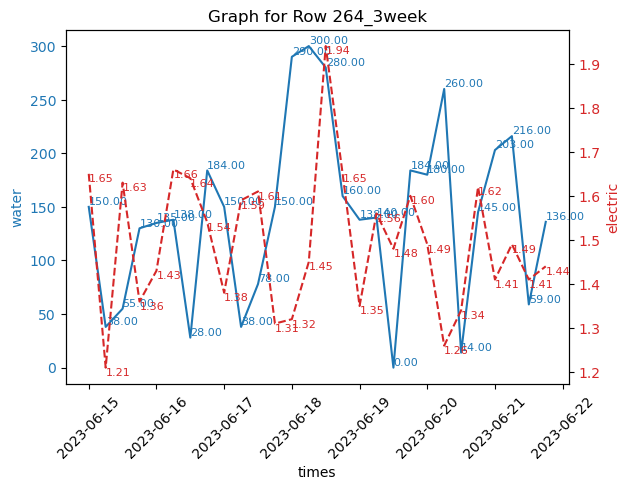

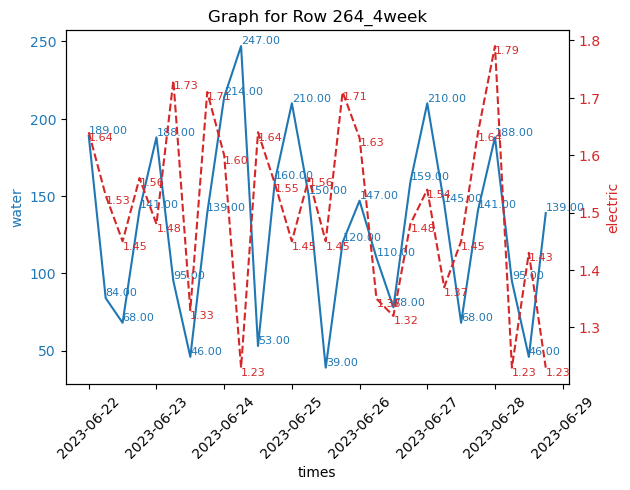

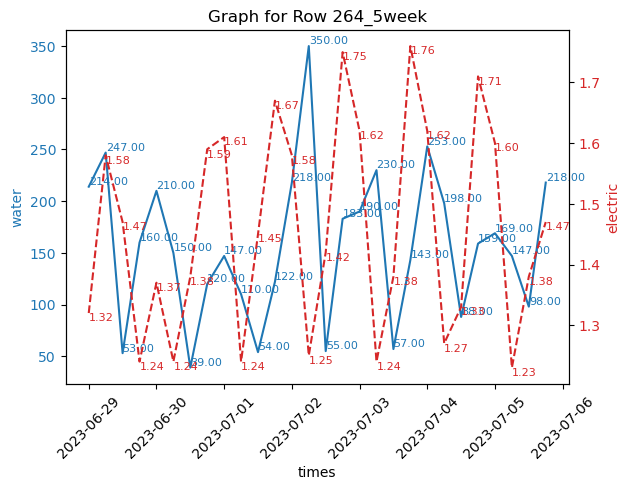

...

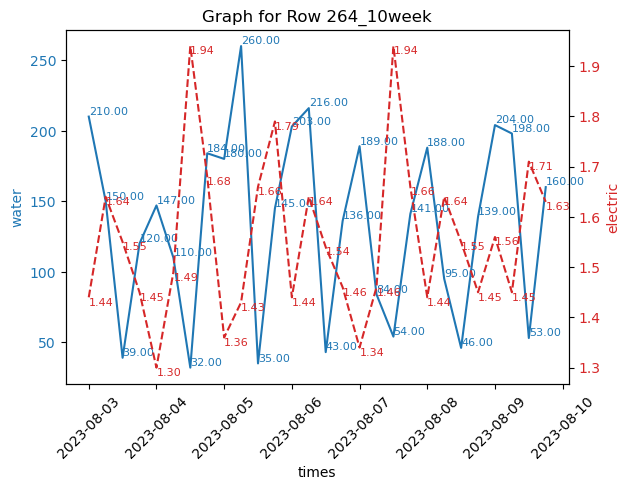

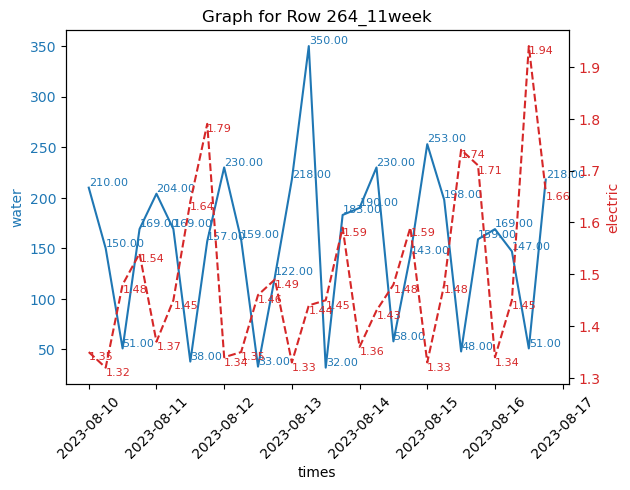

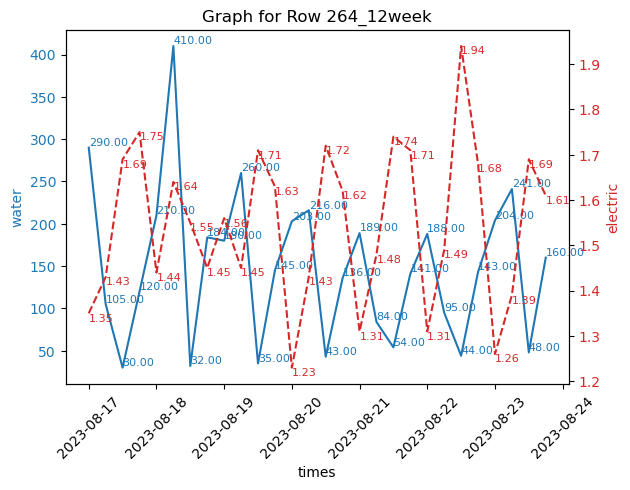

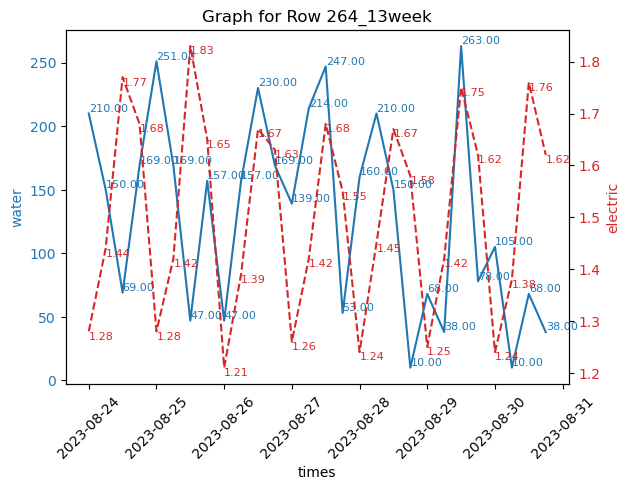

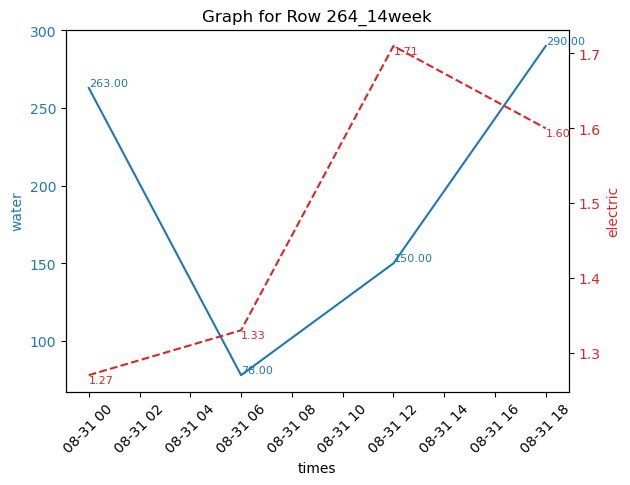

In [8]:
# num_graphs = min(len(waterDF), len(electDF))  # 가능한 최대 그래프 수 제한

# 체크지점 설정
point = 264 # 호수
end = 13
days = 7 * 4 # 하루 4번씩 측정
time_list = pd.date_range('2023-06-01', '2023-09-01', freq = '6H')
time_list = time_list.delete(-1) # 마지막에 shape 맞춰주기 위해 마지막 요소를 지움

# 각 행에 대해 그래프 생성
for i in range(end+1):
    # i번째 행의 데이터 가져오기
    y = waterDF.iloc[point][i*days:((i+1)*days)].values
    z = electDF.iloc[point][i*days:((i+1)*days)].values
    
    # 시간 배열 생성
    # t = np.linspace(0, days, days)
    t = time_list[i*days:((i+1)*days)]
    
    # 그래프 생성
    fig, ax1 = plt.subplots()
    
    # 첫 번째 y축 - 물 데이터
    color = 'tab:blue'
    ax1.set_xlabel('times')
    ax1.set_ylabel('water', color=color)
    ax1.plot(t, y, color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    
    plt.xticks(rotation=45)

    # # 물 데이터에 대해 각 데이터 포인트 위에 수치 표시
    for j, value in enumerate(y):
        ax1.text(t[j], y[j], f'{value:.2f}', va='bottom', color=color, fontsize=8)
        # va='bottom'는 수직 방향 설정(vertical alignment) // top, center, bottom

    # 두 번째 y축 - 전기 데이터
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('electric', color=color)
    ax2.plot(t, z, color=color, linestyle='--')
    ax2.tick_params(axis='y', labelcolor=color)
    
    # 전기 데이터에 대해 각 데이터 포인트 위에 수치 표시
    for j, value in enumerate(z):
        ax2.text(t[j], z[j], f'{value:.2f}', va='top', color=color, fontsize=8)

    # 레이아웃 조정 및 그래프 표시
    fig.tight_layout()
    plt.title(f'Graph for Row {point}_{i+1}week')  # 각 그래프에 제목 추가
    plt.show()

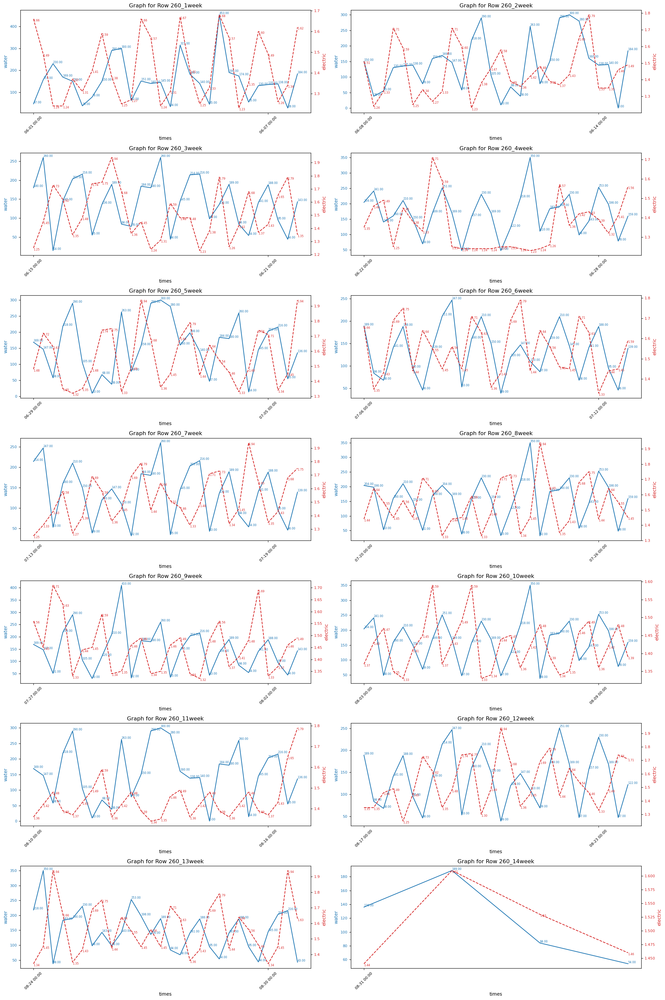

In [139]:
# 체크지점 설정
point = 260 # 호수
end = 13
days = 7 * 4  # 하루 4번씩 측정
time_list = pd.date_range('2023-06-01', '2023-09-01', freq='6H')
time_list = time_list.delete(-1) # 마지막 요소 삭제하여 shape 맞추기

# 서브플롯 생성
fig, axes = plt.subplots(7, 2, figsize=(20, 30)) # 7행 2열의 서브플롯 배열 (14개의 그래프)
axes = axes.flatten() # 2D 배열을 1D로 변환하여 루프에서 쉽게 접근

# 각 행에 대해 그래프 생성
for i in range(end + 1):
    # i번째 행의 데이터 가져오기
    y = waterDF.iloc[point][i * days:((i + 1) * days)].values
    z = electDF.iloc[point][i * days:((i + 1) * days)].values
    
    # 시간 배열 생성
    t = time_list[i * days:((i + 1) * days)]
    
    # 각 서브플롯에 그래프 그리기
    ax1 = axes[i]
    
    # 첫 번째 y축 - 물 데이터
    color = 'tab:blue'
    ax1.set_xlabel('times', fontsize=10)
    ax1.set_ylabel('water', color=color, fontsize=10)
    ax1.plot(t, y, color=color)
    ax1.tick_params(axis='y', labelcolor=color, labelsize=8)
    ax1.tick_params(axis='x', labelsize=8)
    ax1.set_xticks(t[::24])  # x축 눈금 간격 조정
    ax1.set_xticklabels(t[::24].strftime('%m-%d %H:%M'), rotation=45)

    # 물 데이터에 각 데이터 포인트 위에 수치 표시
    for j, value in enumerate(y):
        ax1.text(t[j], y[j], f'{value:.2f}', va='bottom', color=color, fontsize=6)

    # 두 번째 y축 - 전기 데이터
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('electric', color=color, fontsize=10)
    ax2.plot(t, z, color=color, linestyle='--')
    ax2.tick_params(axis='y', labelcolor=color, labelsize=8)
    
    # 전기 데이터에 각 데이터 포인트 위에 수치 표시
    for j, value in enumerate(z):
        ax2.text(t[j], z[j], f'{value:.2f}', va='top', color=color, fontsize=6)

    # 각 서브플롯에 제목 추가
    ax1.set_title(f'Graph for Row {point}_{i + 1}week', fontsize=12)

# 전체 레이아웃 조정 및 그래프 표시
plt.tight_layout()
plt.show()

In [17]:
# 항상 세부 정보 표시

# 코드 복사
# Load the sheet containing electricity usage data
electricity_usage_df = pd.read_excel(r'C:\Users\KDP-50\OneDrive\바탕 화면\KDT_DYH\14.Company_project\수도전기사용량_3개월분_수정본.xlsx', sheet_name='전기사용량_3개월분')

# Display the first few rows of the data to understand its structure
electricity_usage_df.head()

,전기 검침자료 조회,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 359,Unnamed: 360,Unnamed: 361,Unnamed: 362,Unnamed: 363,Unnamed: 364,Unnamed: 365,Unnamed: 366,Unnamed: 367,Unnamed: 368
0,NaN,2023-06-01 00:00:00,2023-06-01 00:00:00,2023-06-01 00:00:00,2023-06-01 00:00:00,2023-06-02 00:00:00,2023-06-02 00:00:00,2023-06-02 00:00:00,2023-06-02 00:00:00,2023-06-03 00:00:00,...,2023-08-29 00:00:00,2023-08-29 00:00:00,2023-08-30 00:00:00,2023-08-30 00:00:00,2023-08-30 00:00:00,2023-08-30 00:00:00,2023-08-31 00:00:00,2023-08-31 00:00:00,2023-08-31 00:00:00,2023-08-31 00:00:00
1,세대,1,2,3,4,1,2,3,4,1,...,3,4,1,2,3,4,1,2,3,4
2,1호,1.23,1.45,1.73,1.62,1.31,1.48,1.74,1.71,1.3,...,1.66,1.64,1.27,1.29,1.69,1.57,1.26,1.36,1.64,1.59
3,2호,1.35,1.35,1.35,1.34,1.36,1.42,1.41,1.38,1.36,...,1.59,1.48,1.41,1.47,1.54,1.48,1.41,1.47,1.64,1.51
4,3호,1.36,1.44,1.42,1.36,1.36,1.42,1.43,1.39,1.32,...,1.64,1.79,1.34,1.35,1.46,1.49,1.35,1.42,1.47,1.36


In [18]:
# Filter the data to include only rows for households 1호 to 250호
electricity_usage_df = electricity_usage_df[251:500]  # Assuming rows 1 to 250 represent these households
# electricity_usage_df.set_index('Unnamed: 1', inplace=True)  # Set the first column as the index (household names)

# Check for three consecutive equal values for each household
result = []
for household in electricity_usage_df.index:
    usage_values = electricity_usage_df.loc[household].values
    # Check for 3 consecutive identical values
    for i in range(len(usage_values) - 2):
        if usage_values[i] == usage_values[i + 1] == usage_values[i + 2]:
            result.append((household, usage_values[i], i))
            break  # Stop after the first occurrence

# Display results
result

[(251, 1.24, 31),
 (252, 1.24, 7),
 (254, 1.25, 137),
 (255, 1.25, 99),
 (257, 1.24, 31),
 (258, 1.25, 81),
 (259, 1.25, 10),
 (260, 1.23, 233),
 (261, 1.24, 95),
 (262, 1.24, 107),
 (264, 1.25, 84),
 (265, 1.25, 13),
 (266, 1.23, 33),
 (267, 1.24, 190),
 (268, 1.24, 131),
 (269, 1.23, 249),
 (270, 1.25, 33),
 (271, 1.25, 205),
 (272, 1.25, 112),
 (273, 1.24, 82),
 (274, 1.24, 11),
 (275, 1.25, 51),
 (276, 1.24, 186),
 (277, 1.25, 177),
 (278, 1.24, 131),
 (279, 1.24, 40),
 (280, 1.35, 116),
 (281, 1.24, 110),
 (282, 1.25, 77),
 (283, 1.25, 6),
 (286, 1.25, 305),
 (287, 1.23, 81),
 (288, 1.23, 10),
 (289, 1.25, 100),
 (290, 1.25, 11),
 (291, 1.25, 133),
 (292, 1.25, 253),
 (293, 1.25, 94),
 (294, 1.23, 145),
 (295, 1.25, 169),
 (296, 1.23, 14),
 (297, 1.25, 229),
 (298, 1.25, 15),
 (300, 1.25, 99),
 (301, 1.23, 146),
 (302, 1.25, 34),
 (303, 1.25, 65),
 (304, 1.24, 59),
 (305, 1.24, 170),
 (306, 1.25, 28),
 (307, 1.25, 329),
 (308, 1.24, 69),
 (309, 1.23, 40),
 (311, 1.23, 32),
 (312, 

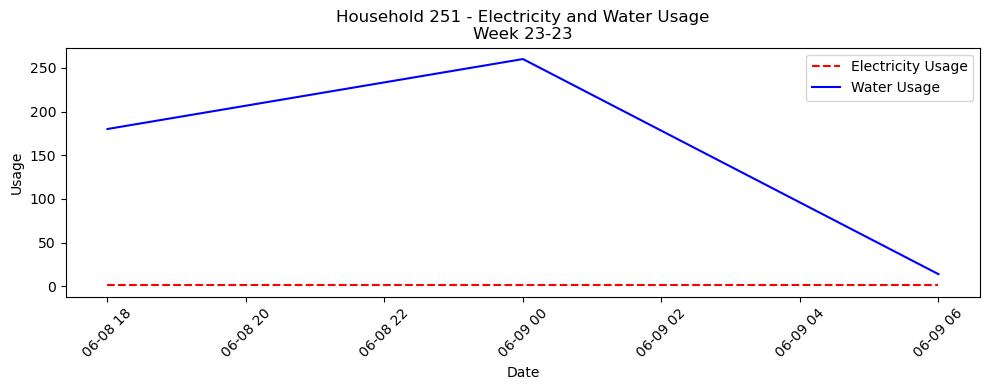

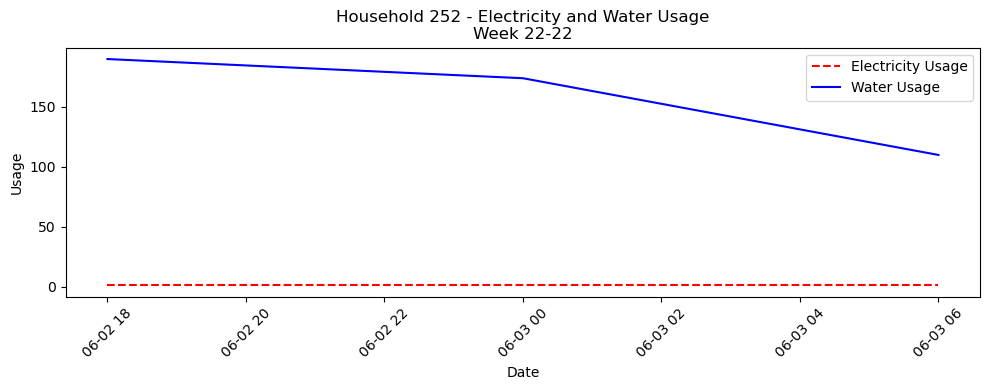

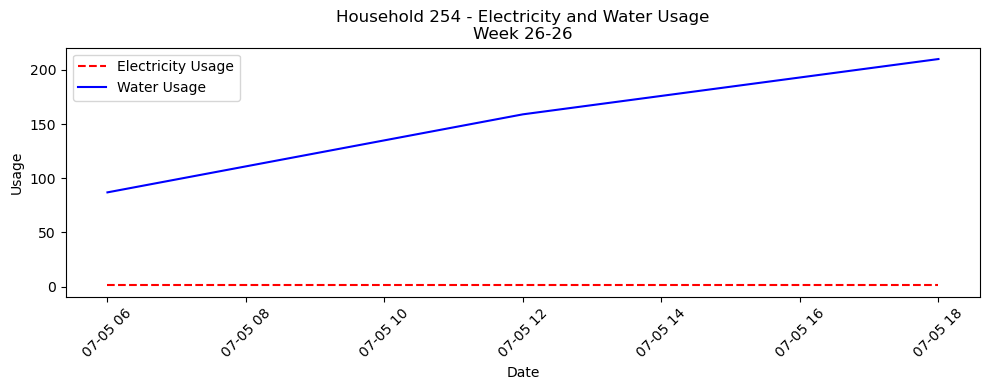

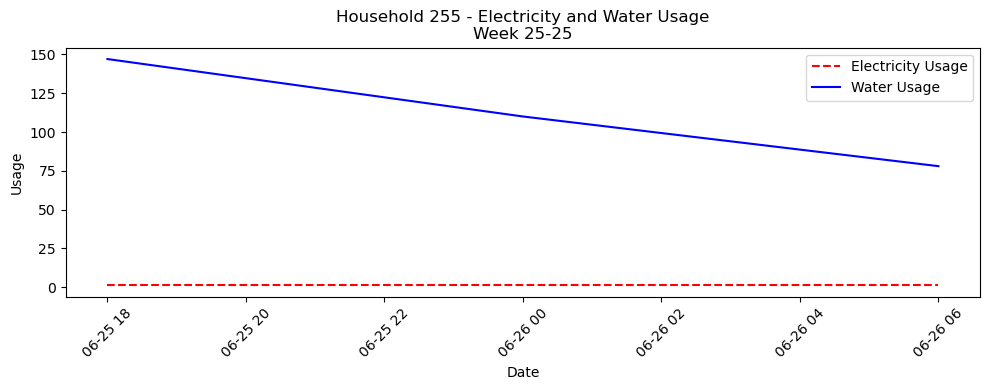

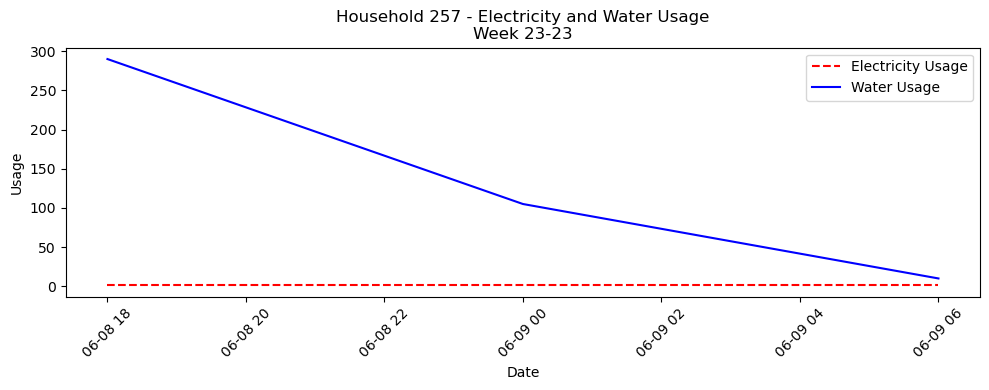

...

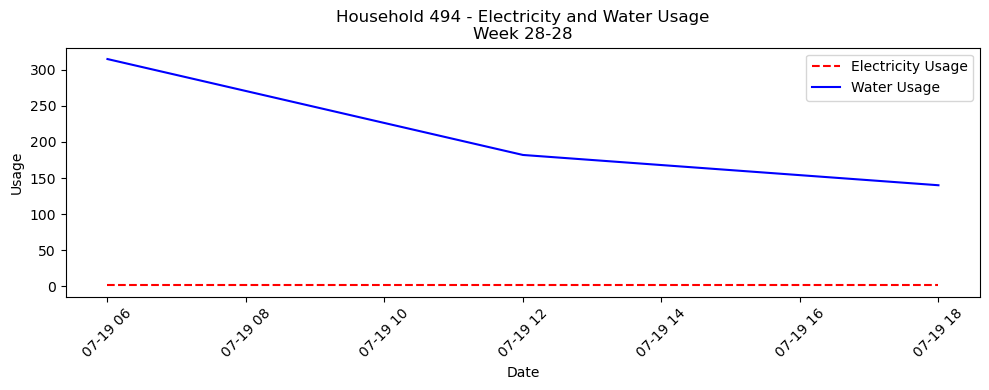

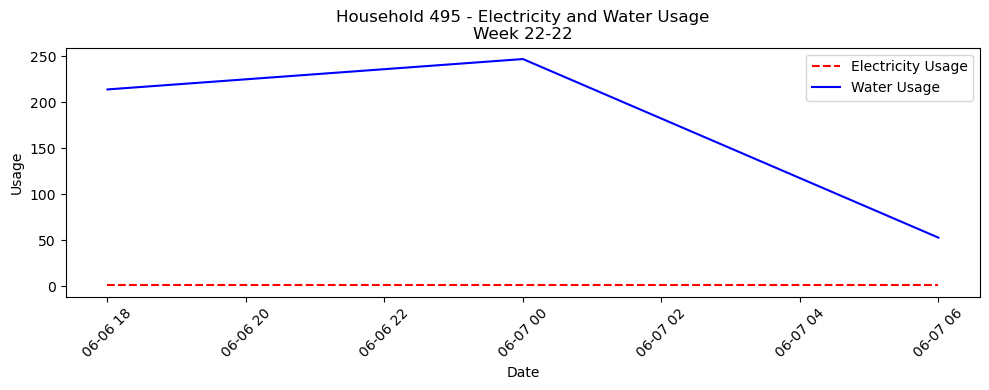

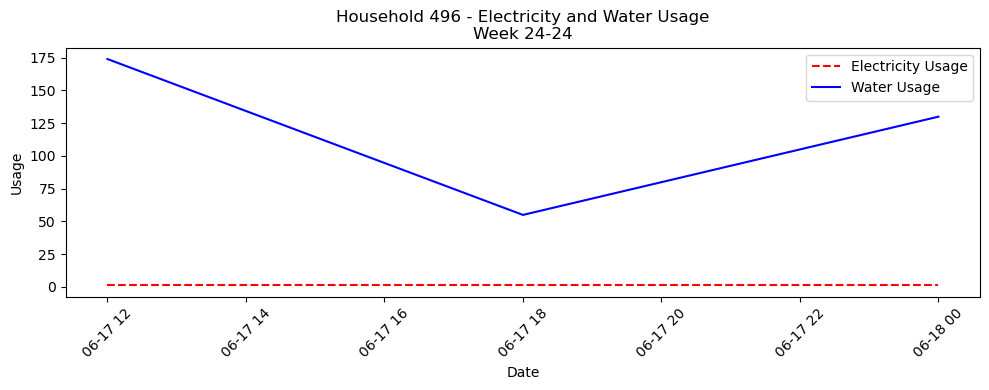

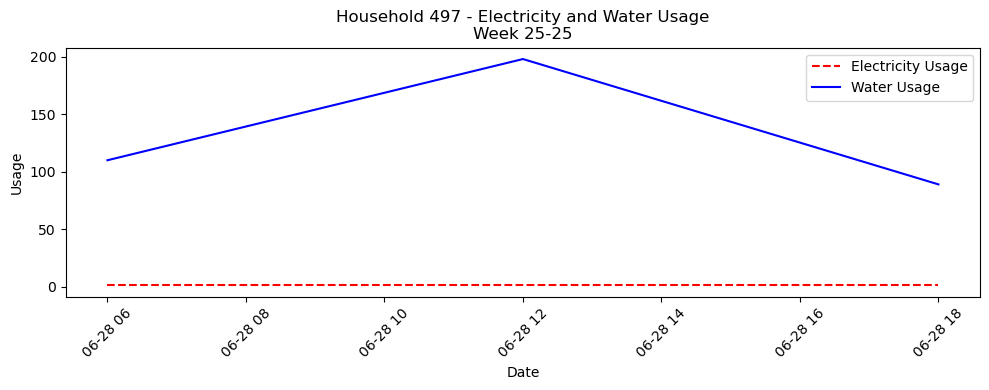

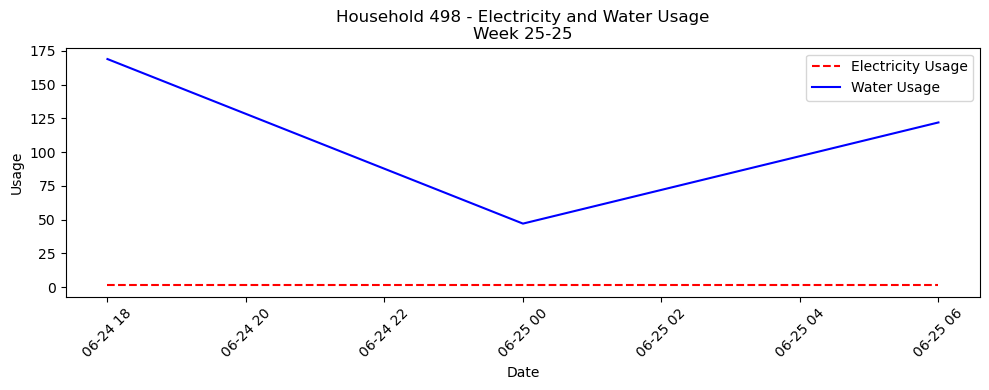

In [19]:
import matplotlib.pyplot as plt
import pandas as pd

# Load water usage data
water_usage_df = pd.read_excel(r'C:\Users\KDP-50\OneDrive\바탕 화면\KDT_DYH\14.Company_project\수도전기사용량_3개월분_수정본.xlsx', sheet_name='수도사용량_3개월분')
# water_usage_df.set_index('Unnamed: 0', inplace=True)

# Create a date range for the x-axis (assuming measurements are taken every 6 hours)
date_range = pd.date_range(start='2023-06-01', periods=len(electricity_usage_df.columns), freq='6H')

# Calculate the ISO week number for June 1st, 2023
start_date = pd.to_datetime('2023-06-01')
start_week_number = start_date.isocalendar()[1]

# Create plots for households with 3 consecutive equal electricity usage values
for household, value, start_idx in result:
    # Get the corresponding electricity and water usage data
    electricity_values = electricity_usage_df.loc[household].values
    water_values = water_usage_df.loc[household].values

    # Ensure the lengths of the arrays are the same
    min_length = min(len(electricity_values), len(water_values))
    electricity_values = electricity_values[:min_length]
    water_values = water_values[:min_length]
    dates = date_range[:min_length]

    # Only plot if the start index and length of consecutive values are within the array bounds
    if start_idx < min_length - 2:  # Ensure start index is within bounds
        # Extract the period of interest for the graph
        date_segment = dates[start_idx:start_idx + 3]
        elec_segment = electricity_values[start_idx:start_idx + 3]
        water_segment = water_values[start_idx:start_idx + 3]

        # Calculate the relative week numbers based on June 1st
        week_numbers = [(date - start_date).days // 7 + start_week_number for date in date_segment]

        # Plot the data
        plt.figure(figsize=(10, 4))
        plt.plot(date_segment, elec_segment, label='Electricity Usage', color='red', linestyle='--')
        plt.plot(date_segment, water_segment, label='Water Usage', color='blue')
        
        # Add week numbers to the plot
        week_label = f'Week {week_numbers[0]}-{week_numbers[-1]}'
        
        # Highlight the specific range for context
        plt.title(f'Household {household} - Electricity and Water Usage\n{week_label}')
        plt.xlabel('Date')
        plt.ylabel('Usage')
        plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
        plt.legend()
        plt.tight_layout()
        plt.show()